About the Data Set:
- Dataset: US_Gun_Violence
- Found at https://www.kaggle.com/ericking310/us-gun-violence
- Originally sourced from gunviolencearchive.org.
- Gun Violence Archive (GVA) is a not for profit corporation formed in 2013 to provide free online public access to accurate information about gun-related violence in the United States. 
- GVA will collect and check for accuracy, comprehensive information about gun-related violence in the U.S. and then post and disseminate it online.
- The dataset is a CSV file containing data for all recorded gun violence incidents in the US between January 2013 and March 2018, inclusive.

Gun Violence Data in the US from 2013 to 2018

In [1]:
import pandas as pd
import numpy as np
df = pd.read_csv('GunViolence.csv')
df.head()

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,...,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,sources,state_house_district,state_senate_district
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,False,...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,0::Julian Sims,NaN,0::Arrested||1::Injured||2::Injured||3::Injure...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,0::Bernard Gillis,NaN,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,False,...,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,0::Damien Bell||1::Desmen Noble||2::Herman Sea...,NaN,"0::Injured, Unharmed, Arrested||1::Unharmed, A...",0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0
3,478925,2013-01-05,Colorado,Aurora,16000 block of East Ithaca Place,4,0,http://www.gunviolencearchive.org/incident/478925,http://www.dailydemocrat.com/20130106/aurora-s...,False,...,0::29||1::33||2::56||3::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,0::Stacie Philbrook||1::Christopher Ratliffe||...,NaN,0::Killed||1::Killed||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://denver.cbslocal.com/2013/01/06/officer-...,40.0,28.0
4,478959,2013-01-07,North Carolina,Greensboro,307 Mourning Dove Terrace,2,2,http://www.gunviolencearchive.org/incident/478959,http://www.journalnow.com/news/local/article_d...,False,...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,0::Danielle Imani Jameison||1::Maurice Eugene ...,3::Family,0::Injured||1::Injured||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://myfox8.com/2013/01/08/update-mother-sho...,62.0,27.0


This dataset has 239,677 rows and 29 columns with the rows representing individual incidents of gun violence.

In [2]:
df.shape

(239677, 29)

We attempted to make a heatmap, but there was not a sufficient amount of correlation between the columns to perform a proper analysis.

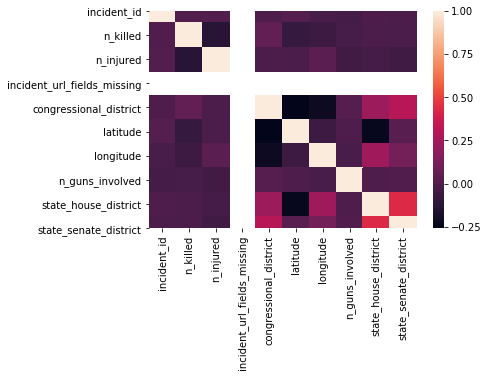

In [4]:
import seaborn as sns
sns.heatmap(df.corr())

This is a scatterplot meant to show the correlation between the amount of guns involved in an incident and the number of people killed in that incident, but there does not seem to be any correlation.

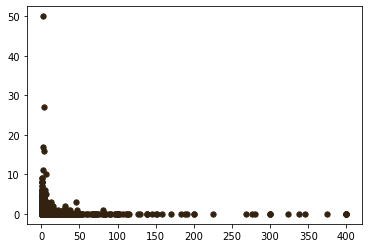

In [5]:
import random
import matplotlib.pyplot as plt

# This line generates a random color every time it is run.
col="#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])

# The number of guns was correlated with the number killed in gun violence.
plt.scatter(df['n_guns_involved'],
            df['n_killed'],
              color=col,
                s=28)
plt.show()

In [6]:
# Gets number of incidents in New Jersey.
df['state'].value_counts()['New Jersey']

5387

We made a pie chart to display the fifty states and the number of instances of gun violence in each state.

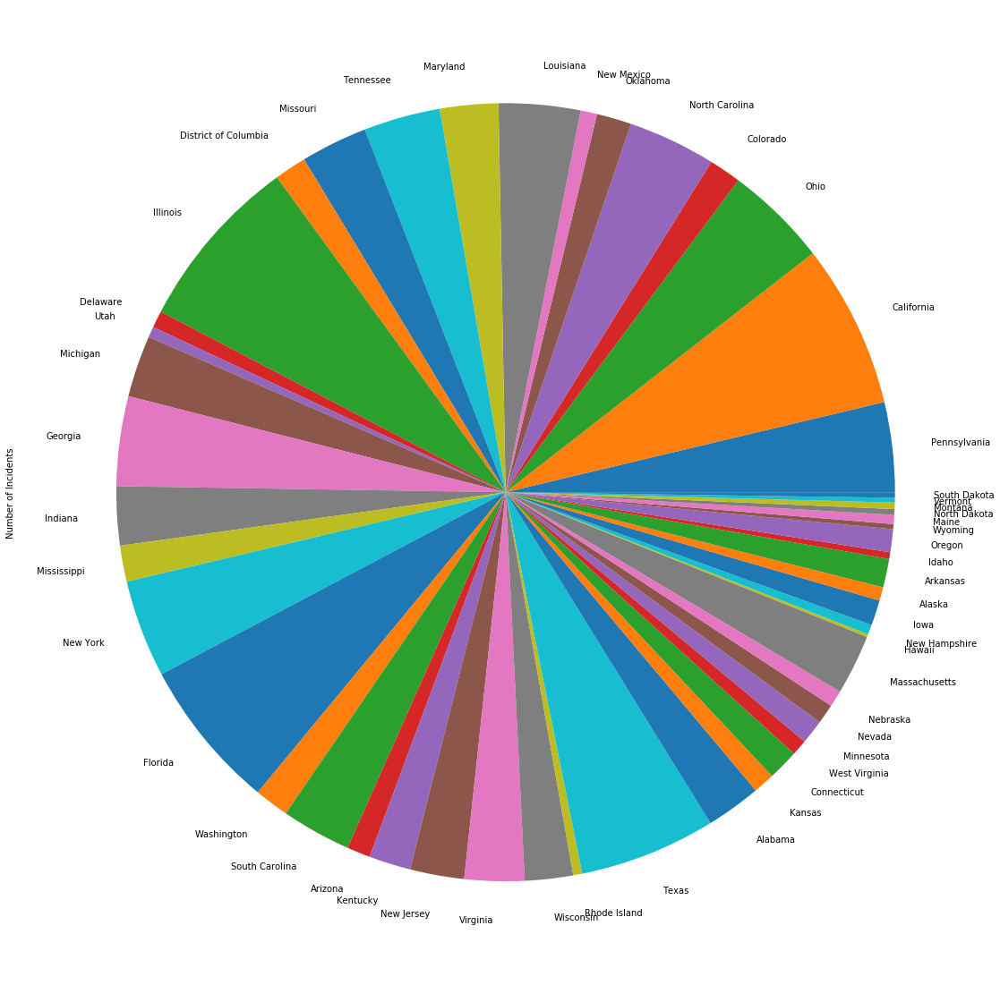

In [7]:
states = list(df['state'].unique())
series = pd.Series(df['state'].value_counts(), index = states, name='Number of Incidents')

series.plot.pie(figsize=(20, 20))

Made new column representing the number of people harmed per gun violence indident by adding the columns of the number killed and the number injured.

In [8]:
df["n_harmed"] = df["n_killed"] + df["n_injured"]

Made new column representing the total number of gun violence incidents per state.

In [9]:
s = {}
s = df['state'].value_counts()
df2 = s.rename_axis('state').reset_index(name='num_incidents')
df2
df = pd.merge(df, df2, on='state')

In [10]:
# As we can see here, there are now 31 columns as opposed to the 29 we had originally.
df.shape

(239677, 31)

In [11]:
# If the line below is uncommented, it would show the updated dataset with two new columns.
# df

Folium enables us to make a choropleth map that shows the number of individual incidents per state. As shown below, the darker states are the ones that have the most incidences of gun violence. (Illinois, California, Florida, and Texas)

In [12]:
%pip install folium
import folium

usa_map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# USA geojson file to be able to map out the latitudes and longitudes of the United States.
usa_geo = r'usa.json'
usa_map.choropleth(geo_data=usa_geo, data=df, columns=['state', 'num_incidents'], key_on='feature.properties.NAME', fill_color='BuPu', legend_name='Number of gun violence incidents per state')
usa_map

Note: you may need to restart the kernel to use updated packages.


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [13]:
# Drop NaNs of latitude and longitude so that the heatmap could be created.
df = df.dropna(subset=['latitude'])
df = df.dropna(subset=['longitude'])

Folium enables us to create heatmaps in addition to the aforementioned choropleth map. This heatmap displays the number killed in gun violence with correspondence to latitude and longitude. The more green parts of the map appear, the higher the concentration of number killed in that area such as in the state of Florida.

In [14]:
from folium import plugins
from folium.plugins import HeatMap

# The heatmap highlights the areas in which more people were killed in gun violence incidents.
usa_map2 = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
max_amount = float(df['n_killed'].max())
hm = HeatMap(list(zip(df.latitude, df.longitude, df.n_killed)),
            min_opacity = 0.2,
            max_val = max_amount
            )
usa_map2.add_child(hm)
usa_map2

Finds out how many males and females were involved in the gun violence incidents.

In [15]:
import re
df = df.dropna(subset=['participant_gender'])
maleCount = 0
femaleCount = 0
for i in df['participant_gender']:
    genders = re.findall(r'(Male|Female)', i)
    for g in genders:
        if "Male" in g:
            maleCount += 1
        if "Female" in g:
            femaleCount += 1
print("Males Involved: " + str(maleCount))
print("Females Involved: " + str(femaleCount))
genderCounts = []
genderCounts.append(maleCount)
genderCounts.append(femaleCount)

Males Involved: 297279
Females Involved: 41554


We found the sum of the number of individuals involved in gun violence and figured out the proportions of each gender.

In [16]:
total_values = sum(genderCounts)
category_proportions = [(float(value) / total_values) for value in genderCounts]

We specified the dimensions of the waffle chart and determined the total number of tiles in the chart.

In [17]:
width = 40  # width of chart
height = 10 # height of chart

total_num_tiles = width * height # total number of tiles

Compute the number of tiles for each category.

In [18]:
tiles_per_category = [round(proportion * total_num_tiles) for proportion in category_proportions]

for i, tiles in enumerate(tiles_per_category):
    print (str(tiles))

351
49


We filled the waffle chart with 1s and 2s for males and females.

In [19]:
# Initialize the waffle chart as an empty matrix.
waffle_chart = np.zeros((height, width))

# Define indices to loop through waffle chart.
category_index = 0
tile_index = 0

# Populate the waffle chart.
for col in range(width):
    for row in range(height):
        tile_index += 1
        
        # If the number of tiles populated for the current category is equal to its corresponding allocated tiles.
        if tile_index > sum(tiles_per_category[0:category_index]):
            # Proceed to the next category.
            category_index += 1
            
        # Set the class value to an integer, which increases with class.
        waffle_chart[row, col] = category_index
        
print ('Waffle chart populated!')

Waffle chart populated!


In [20]:
waffle_chart

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 2., 2., 2., 2.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 2., 2., 2., 2., 2.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 2., 2., 2., 2., 2.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 2., 2., 2., 2., 2.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 2., 2., 2., 2., 2.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
   

We visualized the waffle chart. As shown in the waffle chart, a majority of participants in gun violence are males.

<Figure size 432x288 with 0 Axes>

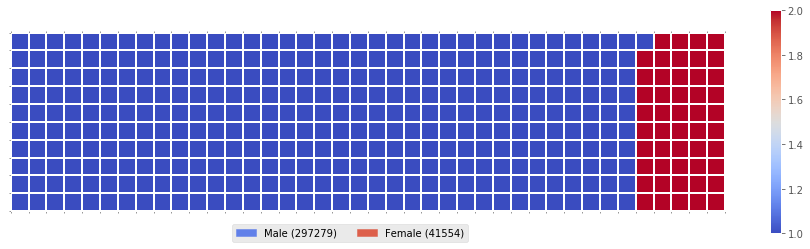

In [21]:
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches # Needed for Waffle Charts

mpl.style.use('ggplot')               # Optional: for ggplot-like style

# Instantiate a new figure object.
fig = plt.figure()

# Use matshow to display the waffle chart.
colormap = plt.cm.coolwarm
plt.matshow(waffle_chart, cmap=colormap)
plt.colorbar()

# Get the axis.
ax = plt.gca()

# Set minor ticks.
ax.set_xticks(np.arange(-.5, (width), 1), minor=True)
ax.set_yticks(np.arange(-.5, (height), 1), minor=True)
    
# Add gridlines based on minor ticks.
ax.grid(which='minor', color='w', linestyle='-', linewidth=2)

plt.xticks([])
plt.yticks([])

# Compute cumulative sum of individual categories to match color schemes between chart and legend.
values_cumsum = np.cumsum(genderCounts)
total_values = values_cumsum[len(values_cumsum) - 1]

# Create legend.
legend_handles = []

legend_handles.append(mpatches.Patch(color=colormap(float(41554)/total_values), label='Male' + " (" + str(genderCounts[0]) + ")"))
legend_handles.append(mpatches.Patch(color=colormap(float(297279)/total_values), label='Female' + " (" + str(genderCounts[1]) + ")"))

# Add legend to chart.
plt.legend(handles=legend_handles,
            loc='lower center', 
            ncol=len(genderCounts),
            bbox_to_anchor=(0., -0.2, 0.95, .1)
          )

Our Findings:
- As indicated in the first map, Illinois, Florida, California, and Texas have the most recorded incidents.
- In the heatmap, a large amount of deaths related to gun violence were recorded in Florida and a couple specific cities across the country.
- The waffle chart clearly demonstrates  that males have been involved in far more gun violence than females have been.
- Other maps we had created indicate similar outcomes.
- For example, using number of people harmed in gun violence vs. number of separate incidents of violence did not show a dramatic difference.
- Generally, capital cities and/or large cities in many states have a higher rate of violence.

Correlation:
- The Joint Economic Committee published a report that illustrates the extent of United States gun violence. https://www.jec.senate.gov/public/_cache/files/8442a070-6f67-4309-a880-460c03a0d93f/gun-violence-in-the-us---a-nation-in-a-league-of-its-own---final.pdf 
- Although the United States does not have more nonlethal crime than in other countries, it has a higher rate of lethal violence.
- The top ten deadliest shootings in the United States since 1982 had fatalities ranging from 15 to 58 which may explain why some spots on the heatmap are warmer.

*
- A New York Times article discusses that California has some of the strictest laws in regards to gun control in the United States. https://www.nytimes.com/2019/07/30/us/california-gun-laws-gilroy.html
- While this article writes that the reason California has high gun crime rates is because the laws are less strict in neighboring areas, this claim is not supported by our dataset.
- The surrounding states are at the lowest end for number of incidents.
- Giffords Law Center actually grants California with an “A” grade in regards to gun control laws and ranks it as number 1 in the country for gun law strength.
- You’ll notice another state with the most incidents is Illinois, according to this dataset.
- However, along with California, Illinois is ranked one of the top 10 states with the strongest gun laws.

*
- According to Giffords Law Center as well, Arizona and New Mexico received “F” grades for gun law strength meaning that they are more lenient with gun ownership, transportation, etc. https://lawcenter.giffords.org/scorecard/#CA
- Our data tells us otherwise, as it shows a minimal number of incidents in comparison to certain other states.
- Another example is Florida. From the same source, Florida receives a C- grade. You would think that a state with a high number of incidents would receive an F grade.
- Texas receives an F grade, but according to our map there have been less incidents than other dark purple states like California and Illinois.

*
- Our heatmap shows hotspots for where the highest number of people killed are.
- Los Angeles and Washington D.C. show some of the most prominent numbers of individuals who were killed through gun violence, yet they received A and A- grades respectively for law strength according to Giffords Law Center.
- Denver, Colorado is prominently displayed on the map as well, but receives an average C grade.
- Additionally, Tacoma, Spokane, and Yakima in Washington state also rank extremely high for number of people killed in gun violence incidents, even though Washington receives a B+ grade.

*
- The top ten states with the weakest gun laws according to GunPolicy.org are South Dakota, Mississippi, Arizona, Vermont, Louisiana, Montana, Kentucky, Wyoming, Kansas and Oklahoma. https://www.gunpolicy.org/firearms/citation/quotes/8271
- Our most interesting find was that these states did not come up often in our data analysis for most incidents of violence or most number of individuals killed.

*

Other things to consider include:
- Population Density of each state.
- What is considered “strict” to our online sources?
- Etc.
- These are important factors that were not a part of our dataset but could affect the outcome of certain studies.
- Our main point is to show how Data Analysis is important and can be used by different professions to make conclusions about information. 

According to our analysis of the US Gun Violence dataset, it is clear that:
- More men than women are participants in gun violence.
- States with stricter gun laws may not necessarily mean less incidents of gun violence.
- Cities tend to have more gun violence.